# **Project: Multimodal Sentiment-Aware Meme Voiceover and Tri-Modal Alignment**

> **Objective**: Use the `met-meme-filtered` dataset to generate sentiment-driven audio for art memes and verify the alignment between images, text, and audio using **ImageBind**.

## **1. Script Generation via Economical LLM API**

In this phase, we transform static meme metadata into natural-sounding voiceover scripts.

### **1.1 Dataset Context**
We utilize the `Emmaruyi/met-meme-filtered` dataset. For each entry, we extract:
* **Image**: The original visual art piece.
* **Caption**: The text content/meme description.
* **Sentiment**: The emotional label (Positive, Negative, or Neutral).

In [25]:
# Cell 1 (clean, no parler, no imagebind)
!pip -q install -U datasets openai pillow tqdm pandas numpy soundfile librosa requests
!pip -q install -U torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
!pip -q install -U "protobuf>=5.29.1,<6" melotts-plus
!pip -q install -U pandas numpy pillow tqdm soundfile librosa requests datasets
!pip -q install -U chattts soundfile



  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.9/176.9 kB 10.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 57.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.7/359.7 kB 34.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 8.8 MB/s eta

In [ ]:
# Load API keys from Colab Secrets
# In Colab: click the 🔑 icon (left sidebar) → add secrets:
#   OPENAI_API_KEY, ELEVENLABS_API_KEY
import os

try:
    from google.colab import userdata
    for _k in ['OPENAI_API_KEY', 'ELEVENLABS_API_KEY']:
        _v = userdata.get(_k)
        if _v:
            os.environ[_k] = _v
except ImportError:
    pass  # local environment: keys already in os.environ

for _k in ['OPENAI_API_KEY', 'ELEVENLABS_API_KEY']:
    print(f'{_k}: {"set" if os.getenv(_k) else "MISSING — add to Colab Secrets"}')


In [ ]:
from pathlib import Path
from datasets import load_dataset
from PIL import Image
import imagehash
import pandas as pd
from tqdm import tqdm

OUT_DIR = Path("/content/drive/MyDrive/met_meme_audio_project")
images_dir = OUT_DIR / "images"
audio_caption_dir = OUT_DIR / "audio_caption"
audio_script_dir = OUT_DIR / "audio_script"

ds = load_dataset("Emmaruyi/met-meme-filtered", split="train")

# 预计算dataset图片哈希
ds_hashes = []
for i in tqdm(range(len(ds)), desc="Hash dataset images"):
    img = ds[i]["image"]
    h = imagehash.phash(img, hash_size=16)
    ds_hashes.append((i, h))

rows = []
local_imgs = sorted(images_dir.glob("*.png"))
for p in tqdm(local_imgs, desc="Match local images"):
    local_h = imagehash.phash(Image.open(p).convert("RGB"), hash_size=16)

    best_i, best_d = None, 10**9
    for i, h in ds_hashes:
        d = local_h - h
        if d < best_d:
            best_d = d
            best_i = i

    rid = int(p.stem)  # 000 -> 0
    row = ds[best_i]

    rows.append({
        "id": rid,
        "img_path": str(p),
        "matched_ds_index": best_i,
        "hash_distance": int(best_d),
        "caption": row["caption"],
        "sentiment_num": int(row["sentiment_num"]),
        "sentiment_degree_num": int(row["sentiment_degree_num"]),
        "intention_num": int(row["intention_num"]),
        "offensiveness_detection_num": int(row["offensiveness_detection_num"]),
        "metaphor_occurrence": int(row["metaphor_occurrence"]),
        "caption_audio": str(audio_caption_dir / f"{rid:03d}_caption.mp3"),
        "script_audio": str(audio_script_dir / f"{rid:03d}_script.mp3"),
    })

meta_df = pd.DataFrame(rows).sort_values("id").reset_index(drop=True)
print(meta_df.head())
print("Max hash distance:", meta_df["hash_distance"].max())
SENTIMENT_MAP = {1:"happiness",2:"love",3:"anger",4:"sorrow",5:"fear",6:"hate",7:"surprise"}
DEGREE_MAP = {1:"slightly",2:"moderately",3:"very"}
INTENTION_MAP = {1:"interactive",2:"expressive",3:"entertaining",4:"offensive",5:"other"}
OFFENSIVE_MAP = {0:"non_offensive",1:"slightly_offensive",2:"moderately_offensive",3:"very_offensive"}
METAPHOR_MAP = {0:"no_metaphor",1:"metaphor_present"}

meta_df["sentiment"] = meta_df["sentiment_num"].map(SENTIMENT_MAP)
meta_df["sentiment_degree"] = meta_df["sentiment_degree_num"].map(DEGREE_MAP)
meta_df["intention"] = meta_df["intention_num"].map(INTENTION_MAP)
meta_df["offensiveness"] = meta_df["offensiveness_detection_num"].map(OFFENSIVE_MAP)
meta_df["metaphor"] = meta_df["metaphor_occurrence"].map(METAPHOR_MAP)

import whisper
from pathlib import Path
from tqdm import tqdm

model = whisper.load_model("small")  # 显存紧张可改 "base"
scripts = []

for p in tqdm(meta_df["script_audio"], desc="Transcribe script audio"):
    p = Path(p)
    if p.exists():
        out = model.transcribe(str(p), language="zh")
        scripts.append(out["text"].strip())
    else:
        scripts.append("")

meta_df["script"] = scripts

out_csv = OUT_DIR / "results_100_samples_recovered.csv"
meta_df.to_csv(out_csv, index=False, encoding="utf-8-sig")
print("Saved:", out_csv)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
from pathlib import Path
import os

# 建议你自己改成想要的目录名
DRIVE_ROOT = Path("/content/drive/MyDrive/met_meme_audio_project")
OUT_DIR = DRIVE_ROOT
OUT_DIR.mkdir(parents=True, exist_ok=True)

images_dir = OUT_DIR / "images"
audio_caption_dir = OUT_DIR / "audio_caption"
audio_script_dir = OUT_DIR / "audio_script"

images_dir.mkdir(parents=True, exist_ok=True)
audio_caption_dir.mkdir(parents=True, exist_ok=True)
audio_script_dir.mkdir(parents=True, exist_ok=True)

print("All outputs will be saved to:", OUT_DIR)

In [ ]:
# Cell 2
# Config  (API keys are loaded from .env — see the dotenv cell above)
import os, random, json, base64, io
from pathlib import Path

# Keys come from environment — never hard-code them here
ELEVENLABS_API_KEY = os.environ['ELEVENLABS_API_KEY']

# Voice catalog
VOICE_CATALOG = {
    "fid4Y0lY1SIYWxYA7XmY": "US_YoungWoman_Urban_MeanLite",
    "UZvzOTzOB44cuv417dz9": "US_YoungMan_Flamboyant",
    "pANoirBU1AZV4gXbNK8C": "US_YoungMan_Playful",
    "X4eFFze8a3EJQLe3zvfM": "SouthernWoman_Sweet_Bright",
    "ifz5HOeQgEFNC90zHmF2": "BritishWoman_Slightly_Smug",
}

VOICE_RANDOM_SEED = 2026
VOICE_STRATEGY = "sentiment_pool"  # random_all / sentiment_pool

DATASET_NAME = "Emmaruyi/met-meme-filtered"
SPLIT = "train"
SAMPLE_SIZE = 100
SEED = 42

# TTS_BACKEND: "elevenlabs" or "parler"
TTS_BACKEND = "elevenlabs"


### **1.2 Scripting Logic**
To optimize costs while maintaining high quality, we utilize **GPT-4o-mini** (or **DeepSeek-V3**).
* **Sampling**: We randomly select **100 entries** for this experiment.
* **Prompting**: The LLM combines the `caption` and `sentiment` to write a 5-10 second script that matches the meme's "vibe" and emotional tone.

In [ ]:
# Cell 3
# Load Dataset and Random Choose 100
from datasets import load_dataset
import pandas as pd
import random

random.seed(SEED)

ds = load_dataset(DATASET_NAME, split=SPLIT)
print(ds)

cols = ds.column_names
image_col = "image"
caption_col = "caption" if "caption" in cols else ("text" if "text" in cols else None)

assert image_col in cols, f"没找到 image 字段，当前字段: {cols}"
assert caption_col is not None, f"没找到 caption/text 字段，当前字段: {cols}"
assert "sentiment_num" in cols, f"没找到 sentiment_num 字段，当前字段: {cols}"

# 映射表（按你给的定义）
SENTIMENT_MAP = {
    1: "happiness",
    2: "love",
    3: "anger",
    4: "sorrow",
    5: "fear",
    6: "hate",
    7: "surprise",
}
DEGREE_MAP = {
    1: "slightly",
    2: "moderately",
    3: "very",
}
INTENTION_MAP = {
    1: "interactive",
    2: "expressive",
    3: "entertaining",
    4: "offensive",
    5: "other",
}
OFFENSIVE_MAP = {
    0: "non_offensive",
    1: "slightly_offensive",
    2: "moderately_offensive",
    3: "very_offensive",
}
METAPHOR_MAP = {
    0: "no_metaphor",
    1: "metaphor_present",
}

idxs = random.sample(range(len(ds)), k=min(SAMPLE_SIZE, len(ds)))
sample = ds.select(idxs)

meta = []
images_dir = OUT_DIR / "images"
images_dir.mkdir(exist_ok=True)

for i, row in enumerate(sample):
    img = row[image_col]
    caption = str(row[caption_col]) if row[caption_col] is not None else ""

    s_num = int(row.get("sentiment_num", 1))
    d_num = int(row.get("sentiment_degree_num", 2))
    it_num = int(row.get("intention_num", 5))
    off_num = int(row.get("offensiveness_detection_num", 0))
    m_num = int(row.get("metaphor_occurrence", 0))

    sentiment = SENTIMENT_MAP.get(s_num, "happiness")
    sentiment_degree = DEGREE_MAP.get(d_num, "moderately")
    intention = INTENTION_MAP.get(it_num, "other")
    offensiveness = OFFENSIVE_MAP.get(off_num, "non_offensive")
    metaphor = METAPHOR_MAP.get(m_num, "no_metaphor")

    img_path = images_dir / f"{i:03d}.png"
    img.save(img_path)

    meta.append({
        "id": i,
        "img_path": str(img_path),
        "caption": caption,
        "sentiment": sentiment,
        "sentiment_degree": sentiment_degree,
        "intention": intention,
        "offensiveness": offensiveness,
        "metaphor": metaphor,

        # raw保留
        "sentiment_num": s_num,
        "sentiment_degree_num": d_num,
        "intention_num": it_num,
        "offensiveness_detection_num": off_num,
        "metaphor_occurrence": m_num
    })

meta_df = pd.DataFrame(meta)
meta_df.head()

In [ ]:
# Cell 3B
# Load from generated audios
from google.colab import drive
from pathlib import Path
import pandas as pd

drive.mount('/content/drive')

OUT_DIR = Path("/content/drive/MyDrive/met_meme_audio_project")
csv_candidates = [
    OUT_DIR / "results_100_samples_recovered.csv",
    OUT_DIR / "results_100_samples.csv",
]
csv_path = next((p for p in csv_candidates if p.exists()), None)
assert csv_path is not None, f"CSV not found in {OUT_DIR}"

meta_df = pd.read_csv(csv_path)
assert "script" in meta_df.columns, "CSV must contain script"

if "img_path" not in meta_df.columns:
    meta_df["img_path"] = meta_df["id"].astype(int).map(lambda i: str(OUT_DIR / "images" / f"{i:03d}.png"))
if "caption_audio" not in meta_df.columns:
    meta_df["caption_audio"] = meta_df["id"].astype(int).map(lambda i: str(OUT_DIR / "audio_caption" / f"{i:03d}_caption.mp3"))
if "script_audio" not in meta_df.columns:
    meta_df["script_audio"] = meta_df["id"].astype(int).map(lambda i: str(OUT_DIR / "audio_script" / f"{i:03d}_script.mp3"))

print("Loaded:", csv_path, "rows:", len(meta_df))

In [ ]:
# Cell 4
# Generate Script
from openai import OpenAI
from tqdm import tqdm

client = OpenAI(api_key=os.environ["OPENAI_API_KEY"])
SCRIPT_PROMPT = """You are a professional voice-over script writer for short meme videos.
Given an image, caption, and metadata labels, write a English narration script.

Requirements:
1) Output 1-2 sentences, be brief and concise.
2) The script must clearly align with both the image content and caption meaning.
3) Emotion must strictly follow sentiment + sentiment_degree (include intensity).
4) Tone should match intention (interactive / expressive / entertaining / offensive / other).
5) If metaphor is metaphor_present, you may include a light metaphorical phrasing.
   If metaphor is no_metaphor, keep wording more direct.
6) If offensiveness is non_offensive or slightly_offensive, avoid profanity and explicit insults.
7) Output script text only. No explanations, no quotes.
"""

def image_to_data_url(path):
    with open(path, "rb") as f:
        b64 = base64.b64encode(f.read()).decode("utf-8")
    return f"data:image/png;base64,{b64}"

scripts = []
for row in tqdm(meta, desc="Generating scripts"):
    img_data_url = image_to_data_url(row["img_path"])
    user_text = f"""caption: {row['caption']}
      sentiment: {row['sentiment']}
      sentiment_degree: {row['sentiment_degree']}
      intention: {row['intention']}
      offensiveness: {row['offensiveness']}
      metaphor: {row['metaphor']}
      """

    resp = client.responses.create(
        model="gpt-4.1-mini",
        input=[
            {"role": "system", "content": SCRIPT_PROMPT},
            {"role": "user", "content": [
                {"type": "input_text", "text": user_text},
                {"type": "input_image", "image_url": img_data_url}
            ]}
        ]
    )
    script = resp.output_text.strip()
    scripts.append(script)

meta_df["script"] = scripts
meta_df.head()

## **2. Emotional Text-to-Speech (TTS) Synthesis**

We convert the generated scripts into high-quality audio files, ensuring the vocal performance reflects the labeled sentiment.

### **Model Selection**

| Category | Recommended Model | Sentiment Control |
| :--- | :--- | :--- |
| **Open Source** | **ChatTTS** | Supports "oral tags" (e.g., `[laugh]`, `[uv_break]`) to inject realistic emotion directly into the speech. |
| **Closed Source** | **ElevenLabs** | The gold standard for high-fidelity emotional synthesis with fine-grained API controls for stability and style. |

In [ ]:
# Cell 5
# Map Sentiment to Style Description
def sentiment_to_style(sent):
    s = sent.lower()
    if "happy" in s or "joy" in s or "love" in s or "positive" in s:
        return "cheerful, warm, smiling tone"
    if "sad" in s or "sorrow" in s:
        return "soft, slow, melancholy tone"
    if "anger" in s or "angry" in s or "hate" in s:
        return "firm, intense, slightly harsh tone"
    if "fear" in s:
        return "cautious, trembling, tense tone"
    if "surprise" in s:
        return "energetic, surprised tone with emphasis"
    return "neutral, natural conversational tone"

def sentiment_to_tag(sent):
    s = sent.lower()
    if "happy" in s or "joy" in s or "love" in s: return "[cheerfully]"
    if "sad" in s or "sorrow" in s: return "[sadly]"
    if "anger" in s or "angry" in s or "hate" in s: return "[firmly]"
    if "fear" in s: return "[nervously]"
    if "surprise" in s: return "[surprised]"
    return "[calmly]"

In [ ]:
# Cell 6A
# Closed Source TTS Generation (2 audios, script and caption)

import requests, random
from tqdm import tqdm

audio_caption_dir = OUT_DIR / "audio_caption"
audio_script_dir = OUT_DIR / "audio_script"
audio_caption_dir.mkdir(exist_ok=True)
audio_script_dir.mkdir(exist_ok=True)

ALL_VOICE_IDS = list(VOICE_CATALOG.keys())

def pick_voice_by_sentiment(sentiment, rng):
    s = str(sentiment).lower()

    happy_pool = ["X4eFFze8a3EJQLe3zvfM", "pANoirBU1AZV4gXbNK8C"]            # happiness/love
    anger_hate_pool = ["UZvzOTzOB44cuv417dz9", "ifz5HOeQgEFNC90zHmF2", "fid4Y0lY1SIYWxYA7XmY"]
    sorrow_pool = ["ifz5HOeQgEFNC90zHmF2", "fid4Y0lY1SIYWxYA7XmY"]
    fear_pool = ["ifz5HOeQgEFNC90zHmF2"]
    surprise_pool = ["UZvzOTzOB44cuv417dz9", "X4eFFze8a3EJQLe3zvfM"]
    neutral_fallback_pool = ["fid4Y0lY1SIYWxYA7XmY", "pANoirBU1AZV4gXbNK8C"]

    if s in ["happiness", "love"]:
        pool = happy_pool
    elif s in ["anger", "hate"]:
        pool = anger_hate_pool
    elif s == "sorrow":
        pool = sorrow_pool
    elif s == "fear":
        pool = fear_pool
    elif s == "surprise":
        pool = surprise_pool
    else:
        pool = neutral_fallback_pool

    pool = [v for v in pool if v in VOICE_CATALOG]
    if not pool:
        pool = list(VOICE_CATALOG.keys())
    return rng.choice(pool)


def eleven_tts(text, sentiment, out_path, voice_id, model_id="eleven_multilingual_v2"):
    url = f"https://api.elevenlabs.io/v1/text-to-speech/{voice_id}?output_format=mp3_44100_128"
    tagged_text = f"{sentiment_to_tag(sentiment)} {text}"

    payload = {
        "text": tagged_text,
        "model_id": model_id,
        "voice_settings": {
            "stability": 0.35,
            "similarity_boost": 0.8,
            "style": 0.7,
            "use_speaker_boost": True
        }
    }
    headers = {"xi-api-key": ELEVENLABS_API_KEY, "Content-Type": "application/json"}
    r = requests.post(url, headers=headers, json=payload, timeout=120)
    r.raise_for_status()
    with open(out_path, "wb") as f:
        f.write(r.content)

if TTS_BACKEND == "elevenlabs":
    rng = random.Random(VOICE_RANDOM_SEED)

    row_voice_ids = []
    row_voice_names = []
    row_voice_strategy = []

    for _, row in tqdm(meta_df.iterrows(), total=len(meta_df), desc="ElevenLabs TTS"):
        if VOICE_STRATEGY == "random_all":
            voice_id = rng.choice(ALL_VOICE_IDS)
        else:
            voice_id = pick_voice_by_sentiment(row["sentiment"], rng)

        voice_name = VOICE_CATALOG.get(voice_id, "unknown")

        caption_out = audio_caption_dir / f"{int(row['id']):03d}_caption.mp3"
        script_out = audio_script_dir / f"{int(row['id']):03d}_script.mp3"

        eleven_tts(str(row["caption"]), str(row["sentiment"]), caption_out, voice_id=voice_id)
        eleven_tts(str(row["script"]), str(row["sentiment"]), script_out, voice_id=voice_id)

        row_voice_ids.append(voice_id)
        row_voice_names.append(voice_name)
        row_voice_strategy.append(VOICE_STRATEGY)

    meta_df["voice_id"] = row_voice_ids
    meta_df["voice_name"] = row_voice_names
    meta_df["voice_strategy"] = row_voice_strategy

print("Done closed-source TTS with sentiment-aware voice routing.")

In [26]:
# Cell6B-Helper
# Load generated from closed source paths
from google.colab import drive
from pathlib import Path
import pandas as pd

drive.mount('/content/drive')

OUT_DIR = Path("/content/drive/MyDrive/met_meme_audio_project")
csv_candidates = [
    OUT_DIR / "results_100_samples_recovered.csv",
    OUT_DIR / "results_100_samples.csv",
]

csv_path = next((p for p in csv_candidates if p.exists()), None)
assert csv_path is not None, f"CSV not found in {OUT_DIR}"

meta_df = pd.read_csv(csv_path)
assert "script" in meta_df.columns, "CSV里没有script列。"

if "img_path" not in meta_df.columns:
    meta_df["img_path"] = meta_df["id"].astype(int).map(lambda i: str(OUT_DIR / "images" / f"{i:03d}.png"))

print("Loaded:", csv_path, "rows:", len(meta_df))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loaded: /content/drive/MyDrive/met_meme_audio_project/results_100_samples_recovered.csv rows: 100


**检查script是否正确同步，如果不同步则重新生成**

In [35]:
# Re-transcribe existing script audio to English (no OpenAI key needed)
!pip -q install -U openai-whisper

import whisper
from pathlib import Path
from tqdm import tqdm
import re

def has_cjk(s):
    return bool(re.search(r'[\u4e00-\u9fff]', str(s)))

# load model
model = whisper.load_model("small")  # use "base" if you want faster/cheaper compute

# backup old script
if "script" in meta_df.columns:
    meta_df["script_prev"] = meta_df["script"]
else:
    meta_df["script_prev"] = ""

new_scripts = []
for p in tqdm(meta_df["script_audio"], total=len(meta_df), desc="Whisper EN transcription"):
    p = Path(str(p))
    if not p.exists() or p.stat().st_size == 0:
        new_scripts.append("")
        continue

    # pass 1: force English transcription
    out1 = model.transcribe(str(p), language="en", task="transcribe")
    txt = (out1.get("text") or "").strip()

    # pass 2 fallback: if still Chinese/empty, use translation mode to output English
    if (not txt) or has_cjk(txt):
        out2 = model.transcribe(str(p), task="translate")
        txt = (out2.get("text") or "").strip()

    new_scripts.append(txt)

meta_df["script"] = new_scripts

# quick check
preview = meta_df[["id", "script_prev", "script"]].head(10).copy()
preview["new_has_cjk"] = preview["script"].map(has_cjk)
display(preview)
print("New CJK ratio:", meta_df["script"].map(has_cjk).mean())

# save
out_csv = OUT_DIR / "results_100_samples_rescripted_en.csv"
meta_df.to_csv(out_csv, index=False, encoding="utf-8-sig")
print("Saved:", out_csv)

Whisper EN transcription: 100%|██████████| 100/100 [00:21<00:00,  4.60it/s]


,id,script_prev,script,new_has_cjk
0,0,那我再說一句Hey there!Got a meme to shareLet's see w...,"I saw now calmly, hey there, got a meme to sha...",False
1,1,乾杯某些魔術人可以走上水但 Chuck Norris他走上水了,"Cheerfully, some magicians can walk on water, ...",False
2,2,祝福你我的心门永远是开的但我永远不会让你进去只要你真正欢迎,"Cheerfully, my heart's door is always open, bu...",False
3,3,nervouslyuh oh I have no clue who you areI acc...,"Nervously. Uh-oh, I have no clue who you are. ...",False
4,4,"後果,希望翼翼的会","Sadly, wishing for a peaceful, snowy Christmas...",False
5,5,calmly check out mr potato head flipped upside...,"Calmly, check out Mr. Potato Head flipped upsi...",False
6,6,我问过 Julia有人经常在说我的爸爸来自美国我开心把家取得他就向我开心,Surprised. People kept saying I'm Avery Bulloc...,False
7,7,a surprisewait what if life is about more than...,"I'm surprised. Wait, what if life is about mor...",False
8,8,"產生接種啦!戰區是新面積的綜機揭碎但是仍然有一雙鼻子某些部分都是無敵戰區,作為軍事組織發展有...","Sadly, waiting 500 days without new Game of Th...",False
9,9,uncomely that moment when you realize you stil...,And calmly that moment when you realize you st...,False


New CJK ratio: 0.0
Saved: /content/drive/MyDrive/met_meme_audio_project/results_100_samples_rescripted_en.csv


In [36]:
# Check current scripts
import re

def has_cjk(s):
    return bool(re.search(r'[\u4e00-\u9fff]', str(s)))

show_n = 10
tmp = meta_df[["id", "caption", "script"]].head(show_n).copy()
tmp["script_has_cjk"] = tmp["script"].map(has_cjk)
display(tmp)

cjk_ratio = meta_df["script"].map(has_cjk).mean()
print(f"CJK ratio in script: {cjk_ratio:.2%}")

,id,caption,script,script_has_cjk
0,0,"""GOT NAME?""","I saw now calmly, hey there, got a meme to sha...",False
1,1,SOME MAGICIANS CAN WALK ON WATER CHUCK NORRIS ...,"Cheerfully, some magicians can walk on water, ...",False
2,2,"My doors is always open,but i shall never drag...","Cheerfully, my heart's door is always open, bu...",False
3,3,I DON'T KNOW WHO YOU ARE \nI'VE LOST ALL MY PH...,"Nervously. Uh-oh, I have no clue who you are. ...",False
4,4,I'M DREAMING OF A WHITE CHRISTMAS,"Sadly, wishing for a peaceful, snowy Christmas...",False
5,5,Upside down Mr.Potato Head looks exactly like ...,"Calmly, check out Mr. Potato Head flipped upsi...",False
6,6,PEOPLE KEPT CALLING ME AVERY BULLOCK FROM AMER...,Surprised. People kept saying I'm Avery Bulloc...,False
7,7,DUDE...WHAT...WHAT IF THERE'S MORE TO LIFE THA...,"I'm surprised. Wait, what if life is about mor...",False
8,8,HOW YOU FEEL WHEN IT'S BEEN\n500 DAYSWITHOUT N...,"Sadly, waiting 500 days without new Game of Th...",False
9,9,That moment\nwhen you still don't know her las...,And calmly that moment when you realize you st...,False


CJK ratio in script: 0.00%


**检查完成**

In [38]:
# Cell 6B
# Open Source TTS Generation (2 audios, script and caption)

# Load Current Generated Scripts
from pathlib import Path
import pandas as pd

OUT_DIR = Path("/content/drive/MyDrive/met_meme_audio_project")
meta_df = pd.read_csv(OUT_DIR / "results_100_samples_rescripted_en.csv")

print("Loaded rows:", len(meta_df))
print(meta_df[["id","caption","script"]].head(3))


import ChatTTS
import numpy as np
import soundfile as sf
from pathlib import Path
from tqdm import tqdm

audio_caption_open_dir = OUT_DIR / "audio_caption_open"
audio_script_open_dir = OUT_DIR / "audio_script_open"
audio_caption_open_dir.mkdir(parents=True, exist_ok=True)
audio_script_open_dir.mkdir(parents=True, exist_ok=True)

# sentiment/sentiment_degree/intention 映射成控制token
def control_prompt(sentiment, degree, intention):
    s = str(sentiment).lower()
    d = str(degree).lower()
    it = str(intention).lower()

    # 基础情绪风格
    if s in ["happiness", "love"]:
        emo = "[oral_5][laugh_1]"
    elif s in ["anger", "hate"]:
        emo = "[oral_7][break_2]"
    elif s in ["sorrow", "fear"]:
        emo = "[oral_2][break_5]"
    elif s in ["surprise"]:
        emo = "[oral_6][break_3]"
    else:
        emo = "[oral_4]"

    # 强度
    if d == "slightly":
        inten = "[speed_4]"
    elif d == "very":
        inten = "[speed_6]"
    else:
        inten = "[speed_5]"

    # 语气
    if it == "interactive":
        tone = "[break_4]"
    elif it in ["expressive", "entertaining"]:
        tone = "[laugh_1]"
    else:
        tone = ""

    return f"{emo}{inten}{tone}"

chat = ChatTTS.Chat()
chat.load(compile=False)

# 固定一个speaker，保证100条一致可比
spk = chat.sample_random_speaker()

for _, row in tqdm(meta_df.iterrows(), total=len(meta_df), desc="Open-source ChatTTS"):
    i = int(row["id"])
    sentiment = row.get("sentiment", "happiness")
    degree = row.get("sentiment_degree", "moderately")
    intention = row.get("intention", "other")
    prompt = control_prompt(sentiment, degree, intention)

    caption_text = str(row.get("caption", "")).strip()
    script_text = str(row.get("script", "")).strip()

    # caption
    wavs_cap = chat.infer(
        [caption_text],
        params_refine_text=ChatTTS.Chat.RefineTextParams(prompt=prompt),
        params_infer_code=ChatTTS.Chat.InferCodeParams(spk_emb=spk, temperature=0.3, top_P=0.7, top_K=20),
    )
    cap_out = audio_caption_open_dir / f"{i:03d}_caption_open.wav"
    sf.write(cap_out, np.asarray(wavs_cap[0]), 24000)

    # script
    wavs_scr = chat.infer(
        [script_text],
        params_refine_text=ChatTTS.Chat.RefineTextParams(prompt=prompt),
        params_infer_code=ChatTTS.Chat.InferCodeParams(spk_emb=spk, temperature=0.3, top_P=0.7, top_K=20),
    )
    scr_out = audio_script_open_dir / f"{i:03d}_script_open.wav"
    sf.write(scr_out, np.asarray(wavs_scr[0]), 24000)

meta_df["caption_audio_open"] = meta_df["id"].astype(int).map(lambda i: str(audio_caption_open_dir / f"{i:03d}_caption_open.wav"))
meta_df["script_audio_open"] = meta_df["id"].astype(int).map(lambda i: str(audio_script_open_dir / f"{i:03d}_script_open.wav"))
meta_df["open_tts_model"] = "ChatTTS"
meta_df["open_tts_control"] = "sentiment+degree+intention -> refine_text prompt tokens"

out_csv = OUT_DIR / "results_100_samples_ab.csv"
meta_df.to_csv(out_csv, index=False, encoding="utf-8-sig")
print("Saved:", out_csv)

Loaded rows: 100
   id                                            caption  \
0   0                                        "GOT NAME?"   
1   1  SOME MAGICIANS CAN WALK ON WATER CHUCK NORRIS ...   
2   2  My doors is always open,but i shall never drag...   

                                              script  
0  I saw now calmly, hey there, got a meme to sha...  
1  Cheerfully, some magicians can walk on water, ...  
2  Cheerfully, my heart's door is always open, bu...  


Open-source ChatTTS:   0%|          | 0/100 [00:00<?, ?it/s]WARNING:ChatTTS.core:found invalid characters: {'?', '"'}

text:   2%|▏         | 6/384(max) [00:00, 151.63it/s]

code:   0%|          | 0/2048(max) [00:00, ?it/s]
code:   1%|          | 18/2048(max) [00:00, 179.02it/s]
code:   2%|▏         | 36/2048(max) [00:00, 178.35it/s]
code:   3%|▎         | 71/2048(max) [00:00, 175.91it/s]

text:   0%|          | 0/384(max) [00:00, ?it/s]
text:   9%|▉         | 34/384(max) [00:00, 178.80it/s]

code:   0%|          | 0/2048(max) [00:00, ?it/s]
code:   1%|          | 18/2048(max) [00:00, 179.19it/s]
code:   2%|▏         | 36/2048(max) [00:00, 178.99it/s]
code:   3%|▎         | 54/2048(max) [00:00, 178.99it/s]
code:   4%|▎         | 72/2048(max) [00:00, 179.01it/s]
code:   4%|▍         | 90/2048(max) [00:00, 178.88it/s]
code:   5%|▌         | 108/2048(max) [00:00, 178.57it/s]
code:   6%|▌         | 126/2048(max) [00:00, 178.84it/s]
code:   7%|▋         | 144/2048(max) [00:00, 178.41it/s]
c

Saved: /content/drive/MyDrive/met_meme_audio_project/results_100_samples_ab.csv


In [28]:
# Cell 6C
# Add Wav Path
import os

caption_ext = "mp3" if TTS_BACKEND == "elevenlabs" else "wav"
script_ext = "mp3" if TTS_BACKEND == "elevenlabs" else "wav"

meta_df["caption_audio"] = [
    str(audio_caption_dir / f"{int(i):03d}_caption.{caption_ext}")
    for i in meta_df["id"].astype(int).tolist()
]
meta_df["script_audio"] = [
    str(audio_script_dir / f"{int(i):03d}_script.{script_ext}")
    for i in meta_df["id"].astype(int).tolist()
]

# 过滤掉不存在文件（防止中途失败）
meta_df = meta_df[
    meta_df["caption_audio"].map(os.path.exists) &
    meta_df["script_audio"].map(os.path.exists) &
    meta_df["img_path"].map(os.path.exists)
].reset_index(drop=True)

print("Valid rows:", len(meta_df))

Valid rows: 100


Valid A/B rows: 100



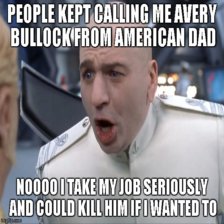
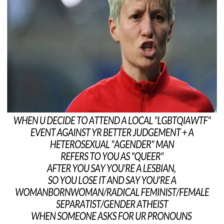
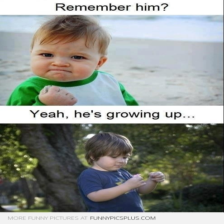
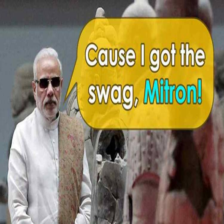
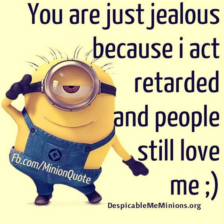
...
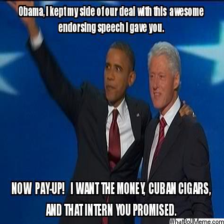
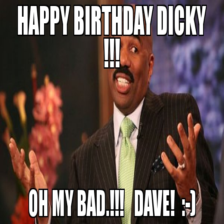
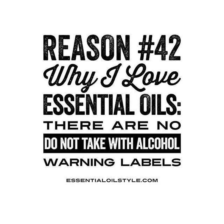
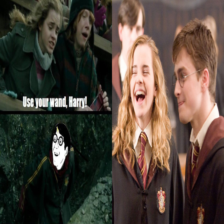
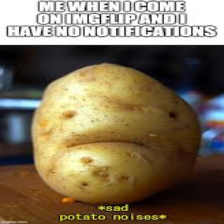

In [39]:
# Cell 6D
# Visualize Cases
# Cell 6D (new): Robust A/B visualization with embedded image+audio (base64)
import random
import base64
from pathlib import Path
import pandas as pd
from IPython.display import display, HTML

def exists(p):
    p = Path(str(p))
    return p.exists() and p.stat().st_size > 0

def file_to_data_uri(path, kind="img"):
    p = Path(str(path))
    if not p.exists() or p.stat().st_size == 0:
        return ""

    ext = p.suffix.lower()
    if kind == "img":
        if ext in [".jpg", ".jpeg"]:
            mime = "image/jpeg"
        elif ext == ".webp":
            mime = "image/webp"
        elif ext == ".gif":
            mime = "image/gif"
        else:
            mime = "image/png"
    else:
        if ext == ".wav":
            mime = "audio/wav"
        elif ext == ".mp3":
            mime = "audio/mpeg"
        elif ext == ".m4a":
            mime = "audio/mp4"
        else:
            mime = "application/octet-stream"

    b64 = base64.b64encode(p.read_bytes()).decode("utf-8")
    return f"data:{mime};base64,{b64}"

# Ensure required columns exist
need_cols = [
    "id", "img_path", "caption", "script", "sentiment",
    "caption_audio", "script_audio",
    "caption_audio_open", "script_audio_open"
]
for c in need_cols:
    if c not in meta_df.columns:
        meta_df[c] = ""

# Keep only rows with all assets present and non-empty
valid_df = meta_df[
    meta_df["img_path"].map(exists) &
    meta_df["caption_audio"].map(exists) &
    meta_df["script_audio"].map(exists) &
    meta_df["caption_audio_open"].map(exists) &
    meta_df["script_audio_open"].map(exists)
].reset_index(drop=True)

print("Valid A/B rows:", len(valid_df))

def render_ab(df, k=15, seed=123):
    if len(df) == 0:
        return "<h3>No valid A/B data found.</h3>"

    rng = random.Random(seed)
    pick = rng.sample(list(df.index), k=min(k, len(df)))
    sub = df.loc[pick]

    blocks = ["""
    <h2>A/B Comparison (Closed vs Open)</h2>
    <p style="color:#666;">Closed: ElevenLabs | Open: ChatTTS</p>
    """]

    for _, r in sub.iterrows():
        img_uri = file_to_data_uri(r["img_path"], "img")
        cap_closed_uri = file_to_data_uri(r["caption_audio"], "audio")
        cap_open_uri = file_to_data_uri(r["caption_audio_open"], "audio")
        scr_closed_uri = file_to_data_uri(r["script_audio"], "audio")
        scr_open_uri = file_to_data_uri(r["script_audio_open"], "audio")

        blocks.append(f"""
        <div style="border:1px solid #ddd;border-radius:10px;padding:12px;margin:14px 0;">
          <div style="display:flex;gap:16px;align-items:flex-start;flex-wrap:wrap;">
            <img src="{img_uri}" style="max-width:260px;border-radius:8px;border:1px solid #eee;" />
            <div style="flex:1;min-width:320px;">
              <p><b>ID:</b> {r.get('id','')}</p>
              <p><b>Sentiment:</b> {r.get('sentiment','')}</p>
              <p><b>Caption:</b> {r.get('caption','')}</p>
              <p><b>Script:</b> {r.get('script','')}</p>

              <p><b>Caption Audio - Closed (ElevenLabs)</b></p>
              <audio controls preload="metadata" src="{cap_closed_uri}" style="width:100%;"></audio>

              <p><b>Caption Audio - Open (ChatTTS)</b></p>
              <audio controls preload="metadata" src="{cap_open_uri}" style="width:100%;"></audio>

              <p><b>Script Audio - Closed (ElevenLabs)</b></p>
              <audio controls preload="metadata" src="{scr_closed_uri}" style="width:100%;"></audio>

              <p><b>Script Audio - Open (ChatTTS)</b></p>
              <audio controls preload="metadata" src="{scr_open_uri}" style="width:100%;"></audio>
            </div>
          </div>
        </div>
        """)

    return "\n".join(blocks)

display(HTML(render_ab(valid_df, k=15, seed=123)))

In [40]:
# Cell 6E
# Save Results
# 确保存在（ElevenLabs分支下）
need_cols = ["voice_id", "voice_name", "voice_strategy"]
for c in need_cols:
    if c not in meta_df.columns:
        meta_df[c] = ""

out_csv = OUT_DIR / "results_100_samples.csv"
meta_df.to_csv(out_csv, index=False, encoding="utf-8-sig")
print("Saved:", out_csv)

Saved: /content/drive/MyDrive/met_meme_audio_project/results_100_samples.csv


### 2.3 Run for Visualization
You can see the visualized result here without running the former inference stages. But remember to change path correctly.

In [ ]:
# Cell 0: One-click visualization loader (no regeneration required)
REPO_ROOT = Path("/content/MMAI-MemeSonic")
from pathlib import Path

cands = [
    Path("/content/MMAI-MemeSonic"),
    Path("/content/drive/MyDrive/MMAI-MemeSonic"),
    Path.cwd(),
]
REPO_ROOT = next((p for p in cands if (p / "data").exists() and (p / "outputs").exists()), None)
assert REPO_ROOT is not None, "Repo root not found. Please clone repo first."
print("REPO_ROOT =", REPO_ROOT)

from pathlib import Path
import pandas as pd
import random
import base64
from IPython.display import display, HTML

# ====== adjust if needed ======
REPO_ROOT = Path("/content/MMAI-MemeSonic")
CSV_CANDIDATES = [
    REPO_ROOT / "data/metadata/results_100_samples_rescripted_en_ab.csv",
    REPO_ROOT / "data/metadata/results_100_samples_ab.csv",
    REPO_ROOT / "data/metadata/results_100_samples_rescripted_en.csv",
    REPO_ROOT / "data/metadata/results_100_samples.csv",
]
K = 15
SEED = 123

# ====== load csv ======
csv_path = next((p for p in CSV_CANDIDATES if p.exists()), None)
assert csv_path is not None, f"No metadata CSV found under {REPO_ROOT / 'data/metadata'}"
meta_df = pd.read_csv(csv_path)

# ====== rebuild paths from repo structure ======
meta_df["img_path"] = meta_df["id"].astype(int).map(lambda i: str(REPO_ROOT / "data/images" / f"{i:03d}.png"))
meta_df["caption_audio"] = meta_df["id"].astype(int).map(lambda i: str(REPO_ROOT / "outputs/closed/caption" / f"{i:03d}_caption.mp3"))
meta_df["script_audio"] = meta_df["id"].astype(int).map(lambda i: str(REPO_ROOT / "outputs/closed/script" / f"{i:03d}_script.mp3"))
meta_df["caption_audio_open"] = meta_df["id"].astype(int).map(lambda i: str(REPO_ROOT / "outputs/open/caption" / f"{i:03d}_caption_open.wav"))
meta_df["script_audio_open"] = meta_df["id"].astype(int).map(lambda i: str(REPO_ROOT / "outputs/open/script" / f"{i:03d}_script_open.wav"))

# fallback text cols
for c in ["caption", "script", "sentiment"]:
    if c not in meta_df.columns:
        meta_df[c] = ""

def exists_nonempty(p):
    p = Path(str(p))
    return p.exists() and p.stat().st_size > 0

def to_data_uri(path, kind):
    p = Path(str(path))
    if not exists_nonempty(p):
        return ""
    ext = p.suffix.lower()
    if kind == "img":
        mime = "image/png" if ext == ".png" else "image/jpeg"
    else:
        if ext == ".wav":
            mime = "audio/wav"
        elif ext == ".mp3":
            mime = "audio/mpeg"
        else:
            mime = "application/octet-stream"
    b64 = base64.b64encode(p.read_bytes()).decode("utf-8")
    return f"data:{mime};base64,{b64}"

valid_df = meta_df[
    meta_df["img_path"].map(exists_nonempty) &
    meta_df["caption_audio"].map(exists_nonempty) &
    meta_df["script_audio"].map(exists_nonempty) &
    meta_df["caption_audio_open"].map(exists_nonempty) &
    meta_df["script_audio_open"].map(exists_nonempty)
].reset_index(drop=True)

print("Using CSV:", csv_path)
print("Valid A/B rows:", len(valid_df))

def render_ab(df, k=15, seed=123):
    if len(df) == 0:
        return "<h3>No valid rows found. Check repo paths/files.</h3>"
    rng = random.Random(seed)
    pick = rng.sample(list(df.index), k=min(k, len(df)))
    sub = df.loc[pick]

    html = ['<h2>MemeSonic A/B Demo (Closed vs Open)</h2>']
    for _, r in sub.iterrows():
        img = to_data_uri(r["img_path"], "img")
        cap_c = to_data_uri(r["caption_audio"], "aud")
        scr_c = to_data_uri(r["script_audio"], "aud")
        cap_o = to_data_uri(r["caption_audio_open"], "aud")
        scr_o = to_data_uri(r["script_audio_open"], "aud")

        html.append(f"""
<div style="border:1px solid #ddd;border-radius:10px;padding:12px;margin:12px 0;">
  <div style="display:flex;gap:16px;flex-wrap:wrap;align-items:flex-start;">
    <img src="{img}" style="max-width:250px;border-radius:8px;border:1px solid #eee;" />
    <div style="flex:1;min-width:320px;">
      <p><b>ID:</b> {r['id']} | <b>Sentiment:</b> {r.get('sentiment','')}</p>
      <p><b>Caption:</b> {r.get('caption','')}</p>
      <p><b>Script:</b> {r.get('script','')}</p>

      <p><b>Caption - Closed (ElevenLabs)</b></p>
      <audio controls preload="metadata" src="{cap_c}" style="width:100%;"></audio>

      <p><b>Caption - Open (ChatTTS)</b></p>
      <audio controls preload="metadata" src="{cap_o}" style="width:100%;"></audio>

      <p><b>Script - Closed (ElevenLabs)</b></p>
      <audio controls preload="metadata" src="{scr_c}" style="width:100%;"></audio>

      <p><b>Script - Open (ChatTTS)</b></p>
      <audio controls preload="metadata" src="{scr_o}" style="width:100%;"></audio>
    </div>
  </div>
</div>
""")
    return "\n".join(html)

display(HTML(render_ab(valid_df, k=K, seed=SEED)))

## **3. Tri-Modal Alignment with ImageBind**

### **3.1 What is ImageBind?**
**ImageBind** is a holistic multimodal framework by Meta AI. Unlike standard CLIP (Image-Text) or CLAP (Audio-Text), ImageBind learns a **joint embedding space** across six modalities: Vision, Text, Audio, Depth, Thermal, and IMU.

It acts as a "bridge" between modalities. By mapping different types of data into a single vector space, it allows us to calculate the similarity between an image and an audio file even if they were never paired during training.

In [44]:
# Cell 7 (revised): Multi-setting ImageBind alignment with strict text-audio pairing
import torch
import numpy as np
from pathlib import Path
from imagebind import data
from imagebind.models import imagebind_model
from imagebind.models.imagebind_model import ModalityType

device = "cuda" if torch.cuda.is_available() else "cpu"

model = imagebind_model.imagebind_huge(pretrained=True)
model.eval()
model.to(device)

def cosine_sim(a, b):
    a = torch.nn.functional.normalize(a, dim=-1)
    b = torch.nn.functional.normalize(b, dim=-1)
    return a @ b.T

def top1_acc(sim):
    pred = sim.argmax(axis=1)
    gt = np.arange(sim.shape[0])
    return float((pred == gt).mean())

def recall_at_k(sim, k=5):
    gt = np.arange(sim.shape[0])[:, None]
    topk = np.argpartition(-sim, kth=k-1, axis=1)[:, :k]
    hit = (topk == gt).any(axis=1)
    return float(hit.mean())

def run_alignment(df, text_col, audio_col, name):
    # 1) strict filtering: image/text/audio all valid and aligned by same row id
    sub = df.copy()
    sub = sub[sub["img_path"].map(lambda p: Path(str(p)).exists())]
    sub = sub[sub[audio_col].map(lambda p: Path(str(p)).exists() and Path(str(p)).stat().st_size > 0)]
    sub = sub[sub[text_col].fillna("").astype(str).str.strip() != ""]
    sub = sub.reset_index(drop=True)

    if len(sub) < 2:
        print(f"[{name}] not enough valid rows: {len(sub)}")
        return None

    image_paths = sub["img_path"].tolist()
    text_list = sub[text_col].fillna("").astype(str).tolist()
    audio_paths = sub[audio_col].astype(str).tolist()

    inputs = {
        ModalityType.VISION: data.load_and_transform_vision_data(image_paths, device),
        ModalityType.TEXT: data.load_and_transform_text(text_list, device),
        ModalityType.AUDIO: data.load_and_transform_audio_data(audio_paths, device),
    }

    with torch.no_grad():
        emb = model(inputs)

    sim_vt = cosine_sim(emb[ModalityType.VISION], emb[ModalityType.TEXT]).cpu().numpy()
    sim_va = cosine_sim(emb[ModalityType.VISION], emb[ModalityType.AUDIO]).cpu().numpy()
    sim_at = cosine_sim(emb[ModalityType.AUDIO], emb[ModalityType.TEXT]).cpu().numpy()

    out = {
        "setting": name,
        "n": len(sub),
        "V<->T_top1": top1_acc(sim_vt),
        "V<->A_top1": top1_acc(sim_va),
        "A<->T_top1": top1_acc(sim_at),
        "A<->T_R@5": recall_at_k(sim_at, 5),
        "A<->T_R@10": recall_at_k(sim_at, 10),
    }
    return out

# ---- ensure path columns exist ----
# closed
if "caption_audio" not in meta_df.columns:
    meta_df["caption_audio"] = meta_df["id"].astype(int).map(lambda i: str(OUT_DIR / "audio_caption" / f"{i:03d}_caption.mp3"))
if "script_audio" not in meta_df.columns:
    meta_df["script_audio"] = meta_df["id"].astype(int).map(lambda i: str(OUT_DIR / "audio_script" / f"{i:03d}_script.mp3"))

# open
if "caption_audio_open" not in meta_df.columns:
    meta_df["caption_audio_open"] = meta_df["id"].astype(int).map(lambda i: str(OUT_DIR / "audio_caption_open" / f"{i:03d}_caption_open.wav"))
if "script_audio_open" not in meta_df.columns:
    meta_df["script_audio_open"] = meta_df["id"].astype(int).map(lambda i: str(OUT_DIR / "audio_script_open" / f"{i:03d}_script_open.wav"))

# ---- run 4 settings you asked ----
results = []
results.append(run_alignment(meta_df, text_col="caption", audio_col="caption_audio",       name="caption_text vs closed_caption_audio"))
results.append(run_alignment(meta_df, text_col="caption", audio_col="caption_audio_open",  name="caption_text vs open_caption_audio"))
results.append(run_alignment(meta_df, text_col="script",  audio_col="script_audio",        name="script_text vs closed_script_audio"))
results.append(run_alignment(meta_df, text_col="script",  audio_col="script_audio_open",   name="script_text vs open_script_audio"))

# print
print("\n=== ImageBind Alignment Results (strict paired) ===")
for r in results:
    if r is None:
        continue
    print(f"\n[{r['setting']}] n={r['n']}")
    print(f"Vision <-> Text  Top1 : {r['V<->T_top1']:.4f}")
    print(f"Vision <-> Audio Top1 : {r['V<->A_top1']:.4f}")
    print(f"Audio  <-> Text  Top1 : {r['A<->T_top1']:.4f}")
    print(f"Audio  <-> Text  R@5  : {r['A<->T_R@5']:.4f}")
    print(f"Audio  <-> Text  R@10 : {r['A<->T_R@10']:.4f}")

# optional save
import pandas as pd
res_df = pd.DataFrame([r for r in results if r is not None])
res_csv = OUT_DIR / "imagebind_alignment_comparison.csv"
res_df.to_csv(res_csv, index=False)
print("\nSaved:", res_csv)


=== ImageBind Alignment Results (strict paired) ===

[caption_text vs closed_caption_audio] n=100
Vision <-> Text  Top1 : 0.9800
Vision <-> Audio Top1 : 0.0000
Audio  <-> Text  Top1 : 0.0000
Audio  <-> Text  R@5  : 0.0700
Audio  <-> Text  R@10 : 0.1200

[caption_text vs open_caption_audio] n=100
Vision <-> Text  Top1 : 0.9800
Vision <-> Audio Top1 : 0.0200
Audio  <-> Text  Top1 : 0.0100
Audio  <-> Text  R@5  : 0.0500
Audio  <-> Text  R@10 : 0.0900

[script_text vs closed_script_audio] n=100
Vision <-> Text  Top1 : 0.8500
Vision <-> Audio Top1 : 0.0100
Audio  <-> Text  Top1 : 0.0100
Audio  <-> Text  R@5  : 0.0800
Audio  <-> Text  R@10 : 0.1300

[script_text vs open_script_audio] n=100
Vision <-> Text  Top1 : 0.8500
Vision <-> Audio Top1 : 0.0100
Audio  <-> Text  Top1 : 0.0000
Audio  <-> Text  R@5  : 0.0400
Audio  <-> Text  R@10 : 0.0900

Saved: /content/drive/MyDrive/met_meme_audio_project/imagebind_alignment_comparison.csv
